## Import Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

---
## Load the Datasets

In [2]:
train_df = pd.read_csv("train_data.txt.zip", sep = ':::', names = ['ID', 'TITLE', 'GENRE', 'DESCRIPTION'])
val_df = pd.read_csv("test_data_solution.txt.zip", sep = ':::', names = ['ID', 'TITLE', 'GENRE', 'DESCRIPTION'])
test_df = pd.read_csv("test_data.txt.zip", sep = ':::', names = ['ID', 'TITLE', 'DESCRIPTION'])

C:\Users\VINAY\AppData\Local\Temp\ipykernel_12948\2116598441.py:1: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  train_df = pd.read_csv("train_data.txt.zip", sep = ':::', names = ['ID', 'TITLE', 'GENRE', 'DESCRIPTION'])
C:\Users\VINAY\AppData\Local\Temp\ipykernel_12948\2116598441.py:2: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  val_df = pd.read_csv("test_data_solution.txt.zip", sep = ':::', names = ['ID', 'TITLE', 'GENRE', 'DESCRIPTION'])
C:\Users\VINAY\AppData\Local\Temp\ipykernel_12948\2116598441.py:3: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex 

---
## Concatenate the Train and Validation Datasets

In [3]:
df = pd.concat([train_df, val_df])

In [4]:
df

,ID,TITLE,GENRE,DESCRIPTION
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...
...,...,...,...,...
54195,54196,"""Tales of Light & Dark"" (2013)",horror,"Covering multiple genres, Tales of Light & Da..."
54196,54197,Der letzte Mohikaner (1965),western,As Alice and Cora Munro attempt to find their...
54197,54198,Oliver Twink (2007),adult,A movie 169 years in the making. Oliver Twist...
54198,54199,Slipstream (1973),drama,"Popular, but mysterious rock D.J Mike Mallard..."


---
## Understand the Data

In [5]:
df.describe()

,ID
count,108414.000000
mean,27104.000452
std,15648.285970
min,1.000000
25%,13552.250000
50%,27104.000000
75%,40655.750000
max,54214.000000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 108414 entries, 0 to 54199
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   ID           108414 non-null  int64 
 1   TITLE        108414 non-null  object
 2   GENRE        108414 non-null  object
 3   DESCRIPTION  108414 non-null  object
dtypes: int64(1), object(3)
memory usage: 4.1+ MB


### Check for Missing Values

In [7]:
df.isnull().sum()

ID             0
TITLE          0
GENRE          0
DESCRIPTION    0
dtype: int64

---
## Visualize the Distribution of Genres

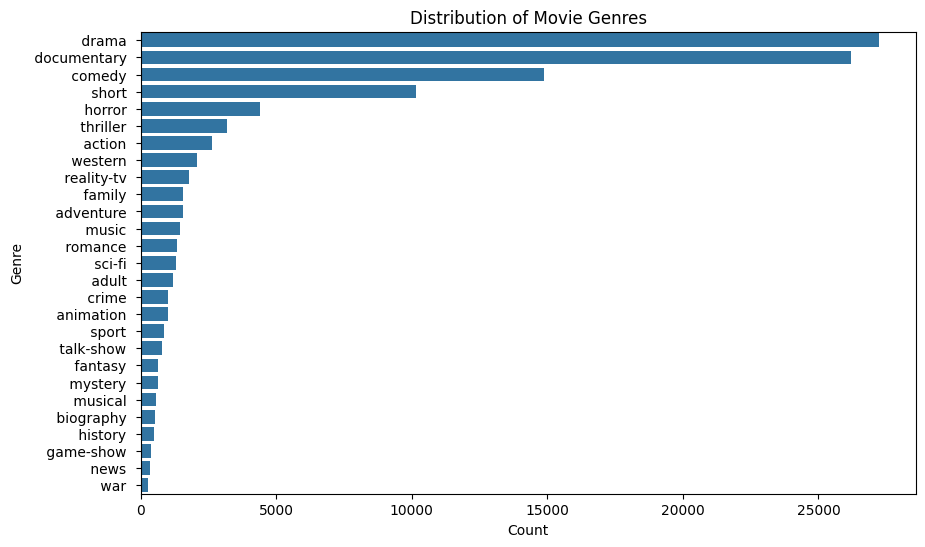

In [8]:
plt.figure(figsize=(10, 6))
sns.countplot(y = df['GENRE'], order = df['GENRE'].value_counts().index)
plt.title('Distribution of Movie Genres')
plt.xlabel('Count')
plt.ylabel('Genre')
plt.show()

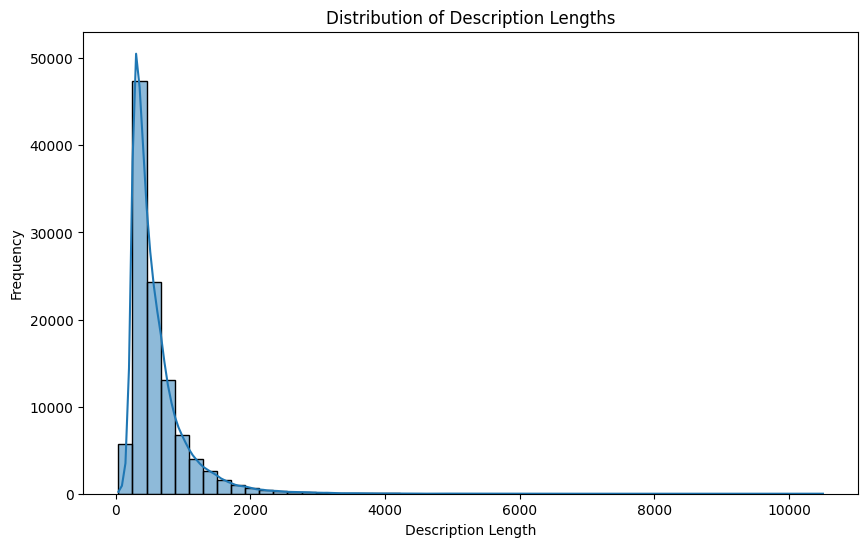

In [9]:
df['description_length'] = df['DESCRIPTION'].apply(len)
plt.figure(figsize=(10, 6))
sns.histplot(df['description_length'], bins=50, kde=True)
plt.title('Distribution of Description Lengths')
plt.xlabel('Description Length')
plt.ylabel('Frequency')
plt.show()

C:\Users\VINAY\AppData\Local\Temp\ipykernel_12948\483059302.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='GENRE', y='word_count', data=df, palette='Set2')


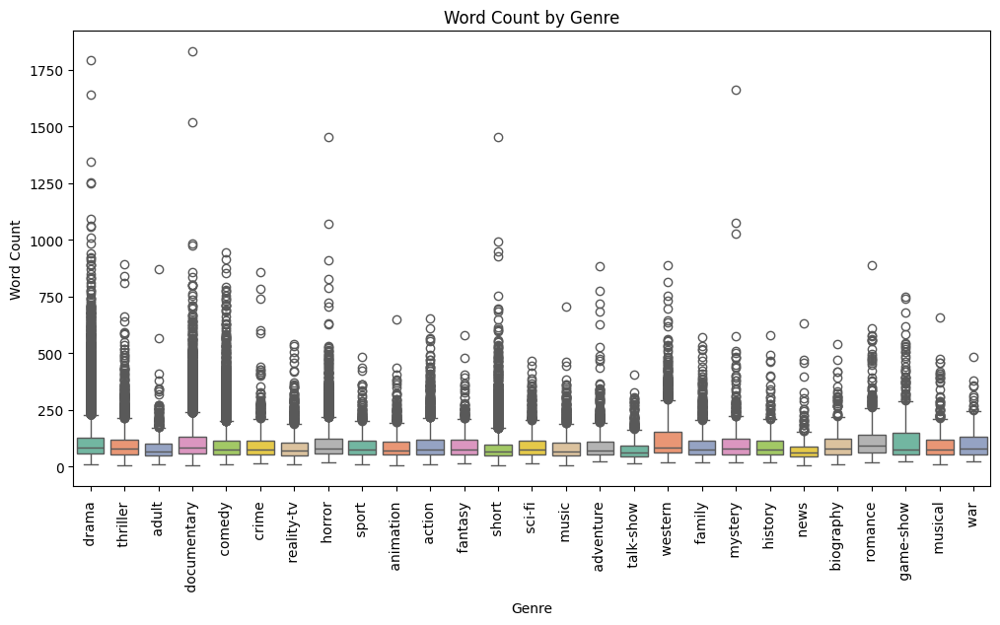

In [10]:
df['word_count'] = df['DESCRIPTION'].apply(lambda x: len(x.split()))

plt.figure(figsize=(12, 6))
sns.boxplot(x='GENRE', y='word_count', data=df, palette='Set2')
plt.title('Word Count by Genre')
plt.xlabel('Genre')
plt.ylabel('Word Count')
plt.xticks(rotation=90)
plt.show()

## Visualize the most frequent words for each genre using word clouds.

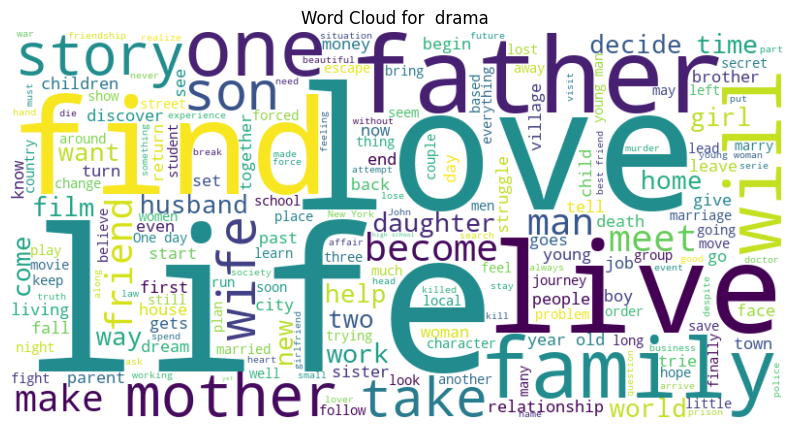

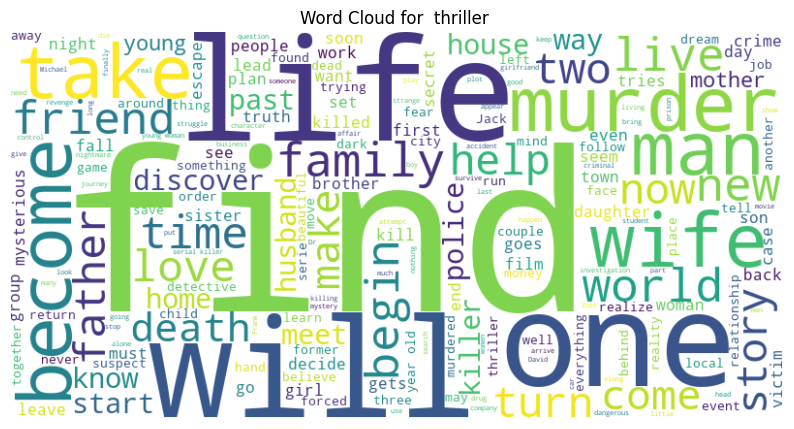

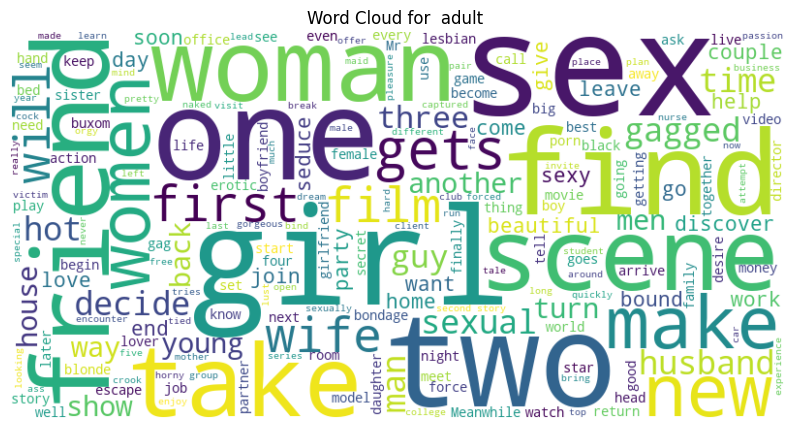

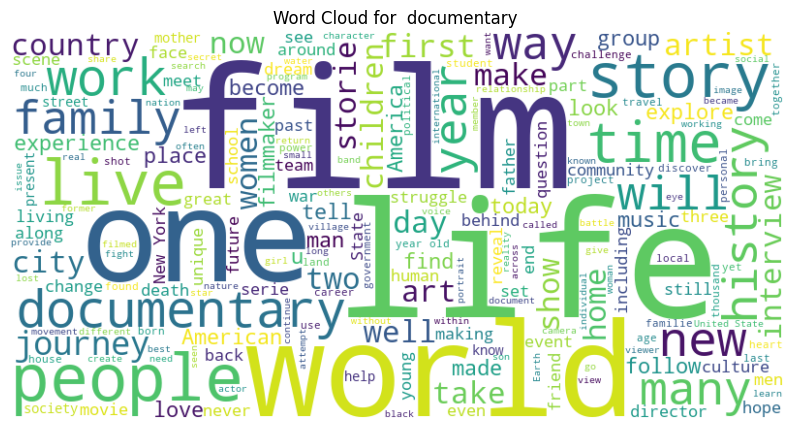

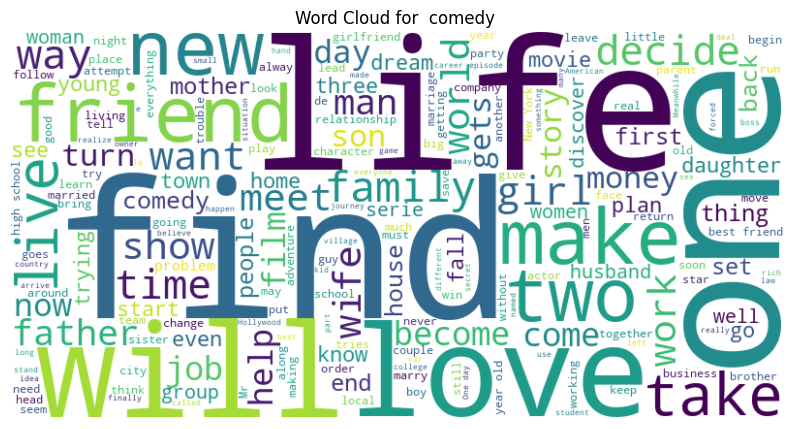

...

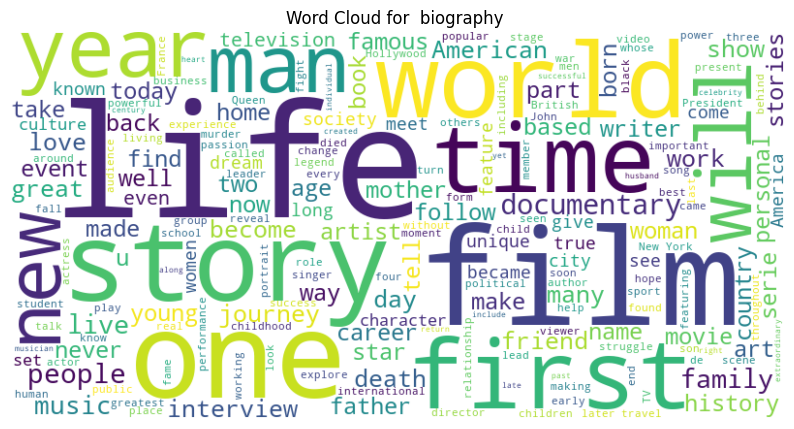

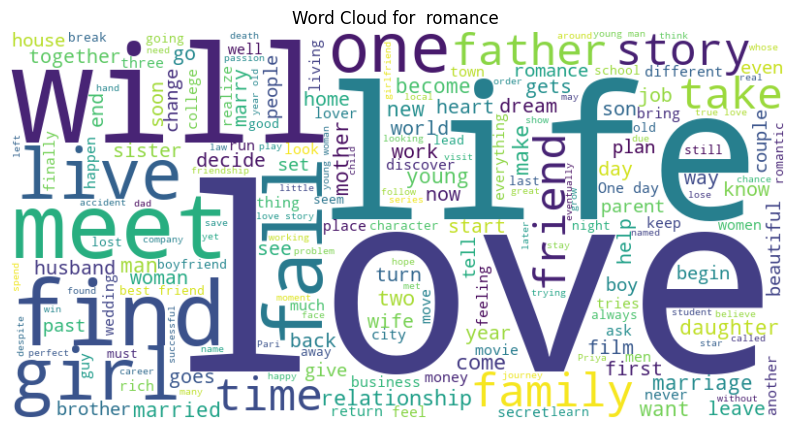

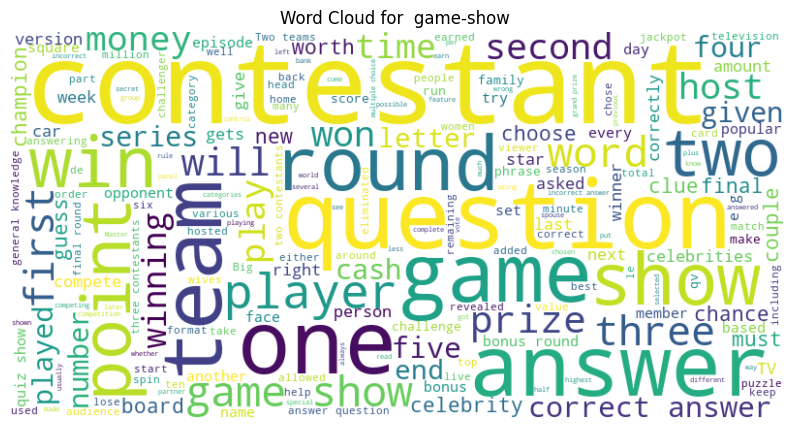

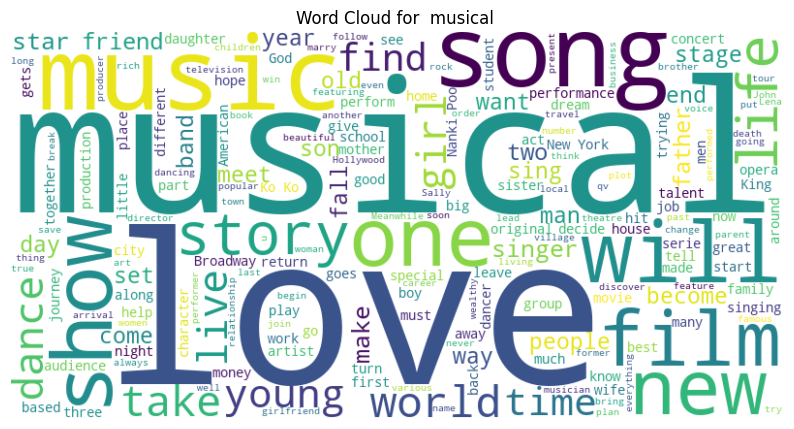

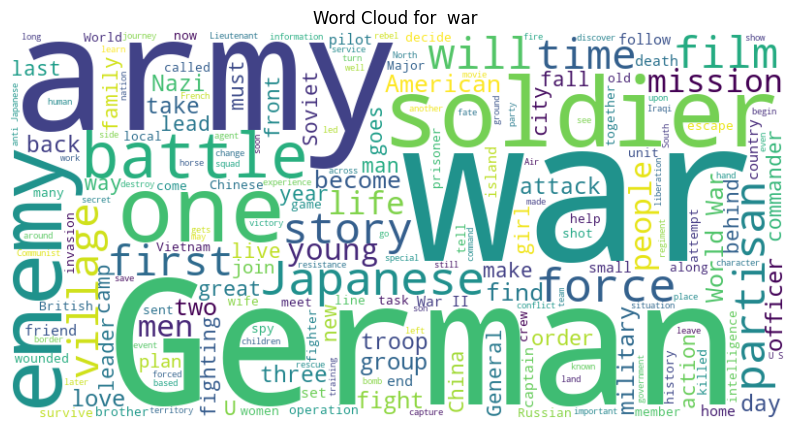

In [11]:
from wordcloud import WordCloud

genres = df['GENRE'].unique()
for genre in genres:
    genre_text = ' '.join(df[df['GENRE'] == genre]['DESCRIPTION'])
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(genre_text)
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {genre}')
    plt.show()

---
## Basic text cleaning

In [12]:
df['cleaned_description'] = df['DESCRIPTION'].str.lower()  
df['cleaned_description'] = df['cleaned_description'].str.replace(r'[^a-z\s]', '', regex=True)  # Remove punctuation and non-alphabetic characters

---
## Text vectorization (using TF-IDF)
#### Text vectorization is the process of converting text data into numerical format so that it can be used as input to machine learning algorithms.

In [13]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score, classification_report

In [14]:
tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features=5000)   # Create a TF-IDF Vectorizer

X_df = tfidf_vectorizer.fit_transform(df['DESCRIPTION'])    
X_test = tfidf_vectorizer.transform(test_df['DESCRIPTION'])

y_df = df['GENRE']

---
## Split the data

In [15]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_df, y_df, test_size=0.2, random_state=42)

---
## Train Naive Bayes classifier

In [16]:
from sklearn.naive_bayes import MultinomialNB
nb_model = MultinomialNB()
nb_model.fit(X_train, y_train)

MultinomialNB()

---
## Evaluate Naive Bayes classifier

In [17]:
nb_predictions = nb_model.predict(X_test)
print("Naive Bayes Classification Report:")
print(classification_report(y_test, nb_predictions))

Naive Bayes Classification Report:


C:\Users\VINAY\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\VINAY\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


               precision    recall  f1-score   support

      action        0.61      0.17      0.26       526
       adult        0.70      0.10      0.18       228
   adventure        0.61      0.08      0.14       304
   animation        0.00      0.00      0.00       211
   biography        0.00      0.00      0.00       103
      comedy        0.51      0.43      0.47      2988
       crime        0.00      0.00      0.00       223
 documentary        0.58      0.86      0.69      5185
       drama        0.48      0.82      0.60      5550
      family        1.00      0.00      0.01       288
     fantasy        0.00      0.00      0.00       147
   game-show        0.93      0.37      0.53        73
     history        0.00      0.00      0.00       116
      horror        0.73      0.44      0.55       883
       music        0.68      0.27      0.39       300
     musical        0.00      0.00      0.00       114
     mystery        0.00      0.00      0.00       114
        n

C:\Users\VINAY\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


---
## Calculate accuracy for Naive Bayes classifier

In [18]:
from sklearn.metrics import accuracy_score
nb_predictions = nb_model.predict(X_test)
nb_accuracy = accuracy_score(y_test, nb_predictions)
print("Naive Bayes Accuracy:", nb_accuracy)

Naive Bayes Accuracy: 0.537241156666513


---
## Train Logistic Regression classifier

In [19]:
from sklearn.linear_model import LogisticRegression
lr_model = LogisticRegression(max_iter=1000)
lr_model.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

---
## Evaluate Logistic Regression classifier

In [20]:
lr_predictions = lr_model.predict(X_test)
print("Logistic Regression Classification Report:")
print(classification_report(y_test, lr_predictions))

Logistic Regression Classification Report:


C:\Users\VINAY\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\VINAY\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


               precision    recall  f1-score   support

      action        0.49      0.34      0.40       526
       adult        0.60      0.27      0.37       228
   adventure        0.57      0.20      0.30       304
   animation        0.57      0.11      0.19       211
   biography        0.00      0.00      0.00       103
      comedy        0.55      0.60      0.57      2988
       crime        0.35      0.05      0.09       223
 documentary        0.69      0.83      0.75      5185
       drama        0.57      0.77      0.65      5550
      family        0.45      0.14      0.22       288
     fantasy        0.60      0.08      0.14       147
   game-show        0.73      0.45      0.56        73
     history        0.00      0.00      0.00       116
      horror        0.67      0.62      0.65       883
       music        0.63      0.48      0.54       300
     musical        0.50      0.04      0.08       114
     mystery        0.29      0.04      0.06       114
        n

C:\Users\VINAY\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


---
## Calculate accuracy for Logistic Regression classifier

In [21]:
lr_predictions = lr_model.predict(X_test)
lr_accuracy = accuracy_score(y_test, lr_predictions)
print("Logistic Regression Accuracy:", lr_accuracy)

Logistic Regression Accuracy: 0.5957201494258174


---
## Prediction on new description

In [22]:
import re
new_description = "A group of friends embark on a journey to find a hidden treasure in the mountains."

# Basic text cleaning for the new plot summary
new_description_cleaned = new_description.lower()  
new_description_cleaned = re.sub(r'[^a-z\s]', '', new_description_cleaned)  

# using the same TF-IDF vectorizer
new_description_tfidf = tfidf_vectorizer.transform([new_description_cleaned]).toarray()

---
## Predict genre using Naive Bayes classifier

In [23]:
nb_prediction = nb_model.predict(new_description_tfidf)
print("Naive Bayes Prediction:", nb_prediction)

Naive Bayes Prediction: [' documentary ']


---
## Predict genre using Logistic Regression classifier

In [24]:
lr_prediction = lr_model.predict(new_description_tfidf)
print("Logistic Regression Prediction:", lr_prediction)

Logistic Regression Prediction: [' adventure ']
